# Задачи


## Шаг 1. Загрузим данные и изучим общую информацию

Загрузим данные о заведениях общественного питания Москвы.

Путь к файлу: /datasets/moscow_places.csv. Скачать датасет.

Изучим общую информацию о датасете. Сколько заведений представлено? Что можно сказать о каждом столбце? Значения какого типа они хранят? 

In [1]:
#  Установим библиотеку folium для визуализации карты и хороплета.
!pip install folium



[notice] A new release of pip is available: 23.0.1 -> 23.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
# Загрузим необходимые библиотеки
import pandas as pd
import matplotlib.pyplot as plt
from matplotlib.pyplot import figure
import seaborn as sns
import plotly.express as px
import datetime as dt
import json

from plotly import graph_objects as go
from folium import Map, Choropleth, Marker
from folium.plugins import MarkerCluster

In [3]:
# Загрузим датасет
try:
    df = pd.read_csv('/datasets/moscow_places.csv')
except:
    df = pd.read_csv(r"C:\Users\User\OneDrive\Education\1_Ya_DA\15_Tell_a_story_with_data\project\moscow_places.csv")

In [4]:
# Выведем первые 5 строк
df.head()

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
0,WoWфли,кафе,"Москва, улица Дыбенко, 7/1",Северный административный округ,"ежедневно, 10:00–22:00",55.878494,37.478860,5.0,NaN,NaN,NaN,NaN,0,NaN
1,Четыре комнаты,ресторан,"Москва, улица Дыбенко, 36, корп. 1",Северный административный округ,"ежедневно, 10:00–22:00",55.875801,37.484479,4.5,выше среднего,Средний счёт:1500–1600 ₽,1550.0,NaN,0,4.0
2,Хазри,кафе,"Москва, Клязьминская улица, 15",Северный административный округ,"пн-чт 11:00–02:00; пт,сб 11:00–05:00; вс 11:00...",55.889146,37.525901,4.6,средние,Средний счёт:от 1000 ₽,1000.0,NaN,0,45.0
3,Dormouse Coffee Shop,кофейня,"Москва, улица Маршала Федоренко, 12",Северный административный округ,"ежедневно, 09:00–22:00",55.881608,37.488860,5.0,NaN,Цена чашки капучино:155–185 ₽,NaN,170.0,0,NaN
4,Иль Марко,пиццерия,"Москва, Правобережная улица, 1Б",Северный административный округ,"ежедневно, 10:00–22:00",55.881166,37.449357,5.0,средние,Средний счёт:400–600 ₽,500.0,NaN,1,148.0


In [5]:
# Выведем общую информацию о данных
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 8406 entries, 0 to 8405
Data columns (total 14 columns):
 #   Column             Non-Null Count  Dtype  
---  ------             --------------  -----  
 0   name               8406 non-null   object 
 1   category           8406 non-null   object 
 2   address            8406 non-null   object 
 3   district           8406 non-null   object 
 4   hours              7870 non-null   object 
 5   lat                8406 non-null   float64
 6   lng                8406 non-null   float64
 7   rating             8406 non-null   float64
 8   price              3315 non-null   object 
 9   avg_bill           3816 non-null   object 
 10  middle_avg_bill    3149 non-null   float64
 11  middle_coffee_cup  535 non-null    float64
 12  chain              8406 non-null   int64  
 13  seats              4795 non-null   float64
dtypes: float64(6), int64(1), object(7)
memory usage: 919.5+ KB


Вывод

Датасет представлен 8 406 заведениями общественного питания г. Москва.

В таблице 16 столбцов: название, категория, адрес, административный район, часы работы, широта и долгота географической точки, рейтинг, категория цен, средний чек, число с оценкой среднего чека, число с оценкой одной чашки капучино, сетевое заведение или нет, количество посадочных мест.

Солбцы хранят значения: object, float64, int64, некоторые из которых мы изменим в дальнейшем для проведения корректного анализа.

Наименования колонок представлены в хорошем стиле - в нижнем регистре и без пропусков.

# Шаг 2. Выполним предобработку данных

Изучим, есть ли дубликаты в данных. Поищем пропуски: встречаются ли они, в каких столбцах? Можно ли их обработать или оставить как есть?

Выполним предобработку данных:
- Создадим столбец street с названиями улиц из столбца с адресом.
- Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
 - логическое значение True — если заведение работает ежедневно и круглосуточно;
 - логическое значение False — в противоположном случае.

In [6]:
# Выведем количество дубликатов
df.duplicated().sum()

0

In [7]:
# Приведем названия заведений к нижнему регистру
df['name'] = df['name'].str.lower()

In [8]:
# Проверим дубликаты по совокупности полей адреса и 
# названия заведения
df[df.duplicated(subset=['name', 'address'], keep=False)]

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats
1430,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"ежедневно, 09:00–21:00",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,0,188.0
1511,more poke,ресторан,"Москва, Волоколамское шоссе, 11, стр. 2",Северный административный округ,"пн-чт 09:00–18:00; пт,сб 09:00–21:00; вс 09:00...",55.806307,37.497566,4.2,NaN,NaN,NaN,NaN,1,188.0
2211,раковарня клешни и хвосты,ресторан,"Москва, проспект Мира, 118",Северо-Восточный административный округ,"ежедневно, 12:00–00:00",55.810553,37.638161,4.4,NaN,NaN,NaN,NaN,0,150.0
2420,раковарня клешни и хвосты,"бар,паб","Москва, проспект Мира, 118",Северо-Восточный административный округ,"пн-чт 12:00–00:00; пт,сб 12:00–01:00; вс 12:00...",55.810677,37.638379,4.4,NaN,NaN,NaN,NaN,1,150.0
3091,хлеб да выпечка,булочная,"Москва, Ярцевская улица, 19",Западный административный округ,"ежедневно, 09:00–22:00",55.738886,37.411648,4.1,NaN,NaN,NaN,NaN,1,276.0
3109,хлеб да выпечка,кафе,"Москва, Ярцевская улица, 19",Западный административный округ,NaN,55.738449,37.410937,4.1,NaN,NaN,NaN,NaN,0,276.0


In [9]:
len(df[df.duplicated(subset=['name', 'address'], keep=False)])

6

Обнаружили три дубликата, удалим их

In [10]:
df.drop([1511, 2420, 3109], axis=0, inplace=True)

Проверим

In [11]:
len(df[df.duplicated(subset=['name', 'address'], keep=False)])

0

OK

In [12]:
# Выведем количество пропусков
df.isna().sum()

name                    0
category                0
address                 0
district                0
hours                 535
lat                     0
lng                     0
rating                  0
price                5088
avg_bill             4587
middle_avg_bill      5254
middle_coffee_cup    7868
chain                   0
seats                3611
dtype: int64

В шести колонках есть пропущенные значения

In [13]:
# Применим сортировку
df.isna().sum().sort_values(ascending=False)

middle_coffee_cup    7868
middle_avg_bill      5254
price                5088
avg_bill             4587
seats                3611
hours                 535
name                    0
category                0
address                 0
district                0
lat                     0
lng                     0
rating                  0
chain                   0
dtype: int64

In [14]:
# Посмотрим на долю пропусков
df_ = df.isna().mean() * 100

# Выведем данные на экран
df_.sort_values(ascending=False).round()

middle_coffee_cup    94.0
middle_avg_bill      63.0
price                61.0
avg_bill             55.0
seats                43.0
hours                 6.0
name                  0.0
category              0.0
address               0.0
district              0.0
lat                   0.0
lng                   0.0
rating                0.0
chain                 0.0
dtype: float64

В колонке 'hours' небольшое количество (6 %) пропушенных значений - удалим их.

In [15]:
# Удалим пропуски
# df = df.dropna(subset=['hours'])

Оставим пропуски в колонке hours

In [16]:
# Заменим значения NaN на -1 в колонке seats, не на ноль, так как мы не знаем достоверно, отсутсвуют
# ли сидячие места в данных заведениях; приведём значения к числовому типу данных
# df['seats'] = df['seats'].fillna(-1).astype(int)

Пропуски в колонках middle_avg_bill и middle_coffee_cup могли появиться из-за пропусков в столбце avg_bill. Можно было бы заменить пропуски средними значениями или значением '-1' или вручную проверить заведения и внести недостающую информацию, но это не входит в задачу нашего исследования, поэтому остальные колонки не трогаем. 

In [17]:
# Создадим столбец street с названиями улиц из столбца с адресом.
words = ['улица','ул','переулок','шоссе','проспект','площадь','проезд',
         'аллея','бульвар','набережная','тупик','линия', 'Улица', 'МКАД', 'парк']

words_extract = r".*,\s*\b([^,]*?(?:{})\b[^,]*)[,$]+".format("|".join(words))

df['street'] = df['address'].str.extract(words_extract)[0]

In [18]:
# Создадим столбец is_24/7 с обозначением, что заведение работает ежедневно и круглосуточно (24/7):
# Используем логическую функцю notna, которая возвращает только True
df = df[df['hours'].notna()]

# Используем логический метод contains для проверки истинности условия: True/False
df['is_24/7'] = df['hours'].str.contains('ежедневно, круглосуточно')

# Заменим пропуски на False
df['is_24/7'] = df['is_24/7'].fillna(False)

Вывод

- В ходе предобработки данных удалили пропуски в столбце hours, заменили пропуски в столбце seats на -1, изменили типы данных для столбца chain на bool, для столбца seats на int, пропуски в других столбцах не трогали.
- Создали два столбца, один с названиями улиц, второй, с заведениями работающими ежедневно и круглосуточно.


 Поработаем с неявными дубликатами

In [19]:
df['name'].value_counts()

шоколадница         120
кафе                101
домино'с пицца       77
додо пицца           74
one price coffee     72
                   ... 
bar park 15           1
drive                 1
bassg                 1
мазза                 1
kebab time            1
Name: name, Length: 5219, dtype: int64

In [20]:
# Посмотрим на первые 50 наиболее часто встречающихся названий сетевых заведений общественного питания
df.query('chain == True')['name'].value_counts().head(50)

шоколадница                            120
домино'с пицца                          76
додо пицца                              74
one price coffee                        71
яндекс лавка                            68
cofix                                   65
prime                                   50
кофепорт                                42
кулинарная лавка братьев караваевых     39
хинкальная                              39
теремок                                 38
cofefest                                32
буханка                                 31
чайхана                                 29
му-му                                   27
drive café                              24
кофемания                               23
крошка картошка                         22
андерсон                                22
скалка                                  20
cinnabon                                20
french bakery                           20
штолле                                  19
тануки     

Все заведения в нижнем регистре, вводные слова (типа "кафе" и т. д.), кавычки, "ёлочки" отсутствуют.

In [21]:
df.duplicated(subset=['name', 'category', 'address', 'district'], keep=False)


0       False
1       False
2       False
3       False
4       False
        ...  
8401    False
8402    False
8403    False
8404    False
8405    False
Length: 7868, dtype: bool

Идентичные заведения по наименоваию, категории, адресу, району - отсутствуют.

Можем считать работу с неявными дубликатами оконченой. 

# Шаг 3. Анализ данных


- Какие категории заведений представлены в данных? Исследуйте количество объектов общественного питания по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Ответьте на вопрос о распределении заведений по категориям.

In [22]:
# Сгруппируем заведения по категориям
df_categories = (
    df
        .groupby('category')
        .agg({'category': 'count'})
        .rename(columns={'category': 'count'})
        .sort_values(by='count', ascending=False)
        .reset_index()
)

df_categories

,category,count
0,кафе,2003
1,ресторан,1968
2,кофейня,1398
3,"бар,паб",746
4,пиццерия,628
5,быстрое питание,570
6,столовая,306
7,булочная,249


In [23]:
# Подготовим данные для визуализации
fig = (
    px.bar(
        df_categories
        , x='count'
        , y='category'
        , title='Количество заведений в Москве по категориям'
        , labels={'name': 'Количество заведений', 'total_places': 'Категория заведения'}
        , color='category'
        , color_discrete_sequence=px.colors.qualitative.Pastel
        )
      .update_yaxes(categoryorder='total ascending')
)

# Выведем на экран
fig.show()

Вывод

В данных представлены категории: кафе, ресторан, кофейня, бар,паб, пиццерия, быстрое питание, столовая и булочная. Наиболее распространенными категориями заведений являются: кафе и рестораны, далее с небольшим отрывом кофейни. Наименее распространенные категории заведений столовые и булочные.

---

- Исследуйте количество посадочных мест в местах по категориям: рестораны, кофейни, пиццерии, бары и так далее. Постройте визуализации. Проанализируйте результаты и сделайте выводы.

In [24]:
# Применим фильтрацию
seats_by_category = df.query('seats != -1')

# Используем медиану для определения количества мест по категориям
# Применим группировку с сортировкой от большего к меньшему
seats_by_category = (
    seats_by_category
        .groupby('category')
        .agg({'seats': 'median'})
        .rename(columns={'seats': 'seats_by_category'})
        .sort_values(by='seats_by_category', ascending=False)
        .reset_index()
)

seats_by_category.round()

,category,seats_by_category
0,ресторан,86.0
1,"бар,паб",82.0
2,кофейня,80.0
3,столовая,74.0
4,быстрое питание,70.0
5,кафе,60.0
6,пиццерия,55.0
7,булочная,50.0


In [25]:
# Подготовим данные для визуализации
fig = (
    px.bar(
        seats_by_category
        , x='seats_by_category'
        , y='category'
        , title='Количество (медиана) мест по категориям в заведениях в Москве'
        , labels={'seats_by_category': 'Медианное количество мест'}
        , color_discrete_sequence=['rgb(102, 197, 204)']
        ) 
    .update_yaxes(categoryorder='total ascending')
)

# Установим комфортный размер визуализации
fig.update_layout(
    autosize=False
    , width=700
    , height=400)

fig.show()


(0.0, 600.0)

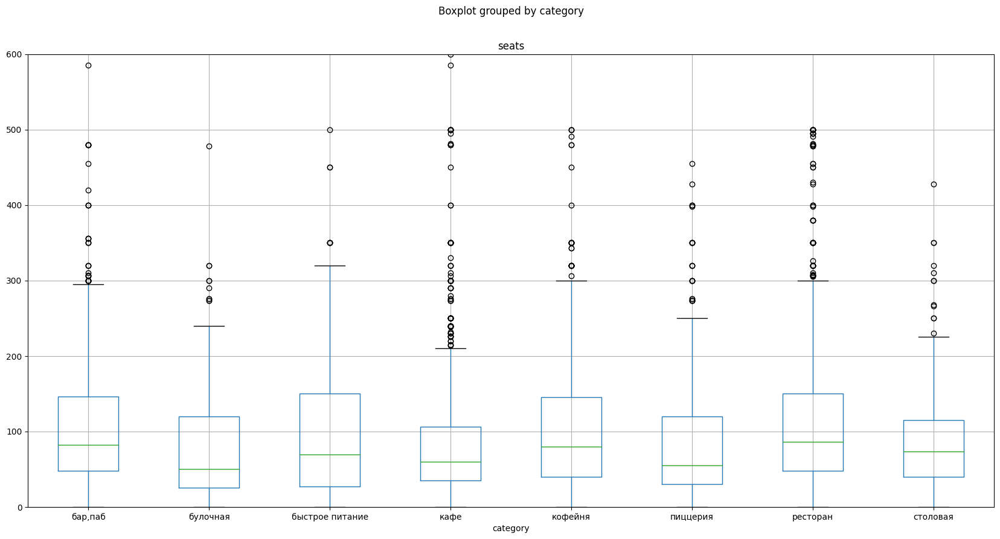

In [26]:
# Строим boxplot
df.boxplot(column='seats', by='category', figsize=(20,10))

plt.ylim(0, 600)

Среднее количество мест в заведениях питания не сильно различается по категориям, оно колеблется от 50 до 86. Больше всего у ресторанов - 86 мест, в заведениях быстрго питания 70 мест, меньше всего в булочных - 50 мест.  
Однако, по всем категориям присутствуют выбросы.

Вывод

Медианное количество мест в заведениях питания в г. Москва:
- больше всего в ресторанах, барах, кофейнях - 86/82/80 соответсвенно;
- меньше всего в булочных и пиццериях - 50 и 55 соответственно.

---

- Рассмотрите и изобразите соотношение сетевых и несетевых заведений в датасете. Каких заведений больше?

In [27]:
# Создадим копию фрейма для решения данной задачи
df_copy = df.copy()

Заменим значения в столбце для последующей визуализации:
- 0 -> несетевое
- 1 -> сетевое

In [28]:
for i in df.index:
    if df_copy.loc[i,'chain'] == 0:
        df_copy.loc[i,'chain'] = 'несетевое'
    else:
        df_copy.loc[i,'chain'] = 'сетевое'

In [29]:
# Положим в переменную группировку с подсчётом количеств
cafe_ratio = (
    df_copy
        .groupby('chain')
        .agg({'name': 'count'})
        .sort_values(by='name', ascending=False)
        .reset_index()   
        .rename(columns={'name': 'quantity'})
)

cafe_ratio

,chain,quantity
0,несетевое,4781
1,сетевое,3087


In [30]:
# Используем круговю диаграмму
fig = go.Figure(
    data=[go.Pie(
        labels=cafe_ratio['chain']
        , values=cafe_ratio['quantity']
        , title='Соотношение сетевых и несетевых заведений '
        )
    ]
)

fig.update_layout(
    autosize=False
    , width=700
    , height=400)

fig.show()

Вывод

- Несетевых заведений больше, они составляют 60.7%  или 4 781 ед. от общего количества заведений.
- Сетевых заведений 39.3% или 3 089 ед.

---

- Какие категории заведений чаще являются сетевыми? Исследуйте данные и ответьте на вопрос графиком.

In [31]:
# Посмотрим на группировку по столбцу name
category_cafe = (
    df_copy
        .groupby(['category','chain'], as_index=False)['name']
        .agg('count')
        .sort_values(by='name', ascending=False)
)

category_cafe

,category,chain,name
6,кафе,несетевое,1292
12,ресторан,несетевое,1257
9,кофейня,сетевое,714
7,кафе,сетевое,711
13,ресторан,сетевое,711
8,кофейня,несетевое,684
0,"бар,паб",несетевое,588
4,быстрое питание,несетевое,346
11,пиццерия,сетевое,330
10,пиццерия,несетевое,298


9, 7, 13 индексы показали высокий рейтинг сетевых заведений

In [32]:
# Объединим серии фреймов при помощи метода merge,
# используем ключи из левого фрейма
df_category_cafe = pd.merge(
    category_cafe
    , df_categories
    , on=['category']
    , how='left'
    )

# Добавим колонку share с результатом деления
df_category_cafe['share'] = (
    df_category_cafe['name'] / df_category_cafe['count'] * 100
    ).round()

df_category_cafe

,category,chain,name,count,share
0,кафе,несетевое,1292,2003,65.0
1,ресторан,несетевое,1257,1968,64.0
2,кофейня,сетевое,714,1398,51.0
3,кафе,сетевое,711,2003,35.0
4,ресторан,сетевое,711,1968,36.0
5,кофейня,несетевое,684,1398,49.0
6,"бар,паб",несетевое,588,746,79.0
7,быстрое питание,несетевое,346,570,61.0
8,пиццерия,сетевое,330,628,53.0
9,пиццерия,несетевое,298,628,47.0


Расчёты в колонке share подверждают предыдущий вывод с индексами

In [33]:
# Визуализируем фрейм с результатами расчётов
fig = (
    px.bar(
        df_category_cafe
        , x="category"
        , y="name"
        , color="chain"
        , text="share"
        , labels={'category': 'Категория заведения', 'name': 'Количество заведений'}
        ,title='Отношение сетевых и несетевых заведений по категориям в Москве'
        )
      .update_xaxes(categoryorder='total descending')
)

fig.show()

Вывод: 

Несмотря на то, что сетевых кафе и ресторанов больше всего по количеству, при сравнении доли сетевых заведений относительно общего количества заведений по категориям, лидируют булочные с показателем в 62 %, далее пиццерии - 53% и кофейни - 51%.

---

- Сгруппируйте данные по названиям заведений и найдите топ-15 популярных сетей в Москве. Под популярностью понимается количество заведений этой сети в регионе. Постройте подходящую для такой информации визуализацию. Знакомы ли вам эти сети? Есть ли какой-то признак, который их объединяет? К какой категории заведений они относятся?

In [34]:
# Применим фильтрацию с сортировкой по убыванию
top_15_cafe = (
    df
        .query('chain == True')
        .sort_values(by='rating', ascending=False)['name']
        .value_counts()
        .reset_index()
)

# Визуализируем названия столбцов
top_15_cafe.columns = ['name', 'counts']

# Положим в переменную только топ-15 заведений 
top_15_cafe = top_15_cafe.head(15)

top_15_cafe

,name,counts
0,шоколадница,120
1,домино'с пицца,76
2,додо пицца,74
3,one price coffee,71
4,яндекс лавка,68
5,cofix,65
6,prime,50
7,кофепорт,42
8,хинкальная,39
9,кулинарная лавка братьев караваевых,39


In [35]:
# Визуализируем топ-15 заведений
fig = (
        px.bar(
                top_15_cafe
                , x='counts'
                , y='name'
                , title='Топ-15 сетей по количеству заведений в Москве'
                , text='counts'
                , labels={'name': 'Название заведения', 'counts': 'Количество заведений сети'})
          .update_yaxes(categoryorder='total ascending')
)

fig.update_layout(
    autosize=False
    , width=1000
    , height=500)

fig.show()

In [36]:
# Создадим переменную со списком заведений из топ-15
variable_top_15_cafe = top_15_cafe['name'].value_counts().index

In [37]:
# Положим внешнюю переменную во вновь создаваемую
df_variable_top_15_cafe = df.query('name in @variable_top_15_cafe')

# Применим группировку с подсчётом количеств
top_names_category = (
    df_variable_top_15_cafe
        .groupby(['name','category'], as_index=False)
        .agg('count')
        .sort_values(by='name')
)

# Выведем визуализацию
fig = px.bar(
    top_names_category
    , x='name'
    , y='chain'
    , color='category'
    , title='Категории топ-15 заведений'
    , labels={'name':'Количество заведений', 'chain':'Название заведения'}
)

            
fig.update_layout(
    autosize=False
    , width=1000
    , height=500)

fig.show()

In [38]:
# Отсортируем категории топ-15 сетевых заведений по общему
# количеству заведений в сети
top_15_category = (
    df
         .query('name in @variable_top_15_cafe')
         .groupby(['category'])
         .count()
         .reset_index()[['category','name']]
         .sort_values('name', ascending=False)
)

fig = px.bar(
    top_15_category
         , x='category'
         , y='name'
         , labels={'name':'Количество заведений','category':'Категория'}
         , title='Категории топ-15 сетевых заведений'
)

fig.update_layout(
    autosize=False
    , width=600
    , height=400)

fig.show()

Топ-15 популярных сетевых заведений относятся в основном к категории: кофеен, пиццерий, ресторанов и кафе.



Вывод

Самой популярной сетью в Москве является Шоколадница - 120 ед.,  замыкает топ-15 Му-му - 27 ед. Топ-15 сформирован на основе рейтинга, поэтому первое что объединяет все заведения это высокий рейтинг. Все заведения находятся преимущественно в центре города, 5 заведений из 15 принадлежат к категории кофейня (Шоколадница, Сofix, Оne Рrice Сoffee, Кофепорт, Сofefest), 4 к категории - кафе (Кулинарная лавка братьев караваевых, Му-Му, Хинакальная, Чайхана), далее по убыванию: ресторан, пиццерия, булочная.

---

- Какие административные районы Москвы присутствуют в датасете? Отобразите общее количество заведений и количество заведений каждой категории по районам. Попробуйте проиллюстрировать эту информацию одним графиком.

In [39]:
# Выведем административные районы и посчитаем количество заведений в них
district_total_cafes = (
    df['district']
        .value_counts()
        .to_frame()
)

district_total_cafes

,district
Центральный административный округ,2211
Северный административный округ,845
Северо-Восточный административный округ,829
Южный административный округ,827
Западный административный округ,785
Восточный административный округ,723
Юго-Западный административный округ,650
Юго-Восточный административный округ,629
Северо-Западный административный округ,369


In [40]:
# Посмотрим на количество заведений в районах по категориям
district_count_cafes = (
    df
        .groupby(['district', 'category'])['name']
        .count().to_frame()
        .reset_index()
)

# Создадим колонки для нашей таблицы
district_count_cafes.columns = ['district', 'category', 'count']

# Выведем таблицу с сортировкой по убыванию по столбцу count
district_count_cafes.sort_values('count', ascending=False)

,district,category,count
46,Центральный административный округ,ресторан,665
43,Центральный административный округ,кафе,444
44,Центральный административный округ,кофейня,426
40,Центральный административный округ,"бар,паб",364
27,Северо-Восточный административный округ,кафе,229
...,...,...,...
1,Восточный административный округ,булочная,23
63,Юго-Западный административный округ,столовая,17
39,Северо-Западный административный округ,столовая,17
33,Северо-Западный административный округ,булочная,12


In [41]:
# Построим визуализацию
fig = (
    px.bar(
        district_count_cafes
        , y='district'
        , x='count'
        , color="category"
        , barmode='stack'
        , labels={'district': 'Название района', 'count': 'Количество заведений', 'category': 'Категория заведения'}
        , title='Количество заведений каждой категории по районам')
      .update_yaxes(categoryorder='total ascending')
)

fig.update_layout(
    autosize=False
    , width=900
    , height=450)

fig.show() 

Вывод

В датасете представлены 9 районов: Восточный административный округ, Западный административный округ, Северный административный округ, Северо-Восточный административный округ, Центральный административный округ, Юго-Восточный административный округ, Юго-Западный административный округ, Южный административный округ. Максимальное количество заведений располагается в центральном округе, больше всего расположено ресторанов - 665 заведений, на втором месте кафе - 444 заведения, на третьем кофейни - 426 заведений.

---

- Визуализируйте распределение средних рейтингов по категориям заведений. Сильно ли различаются усреднённые рейтинги в разных типах общепита?

In [42]:
# Применим группировку с сортировкой
rating_categories = (
    df
        .groupby('category')['rating']
        .agg('mean')
        .sort_values(ascending=False)
        .reset_index()
)

rating_categories.round(3)

,category,rating
0,"бар,паб",4.395
1,пиццерия,4.301
2,ресторан,4.296
3,булочная,4.277
4,кофейня,4.275
5,столовая,4.217
6,кафе,4.150
7,быстрое питание,4.059


In [43]:
# Визуализируем данные
fig = (
    px.bar(
        rating_categories
        , x='category'
        , y='rating'
        , color='category'
        , labels={'category': 'Категория заведеня', 'rating': 'Средний рейтинг'}
        , title='Средние рейтинги категорий заведений'
    )
)

# Отразим деления по 'y' по 0.1 для наглядной визуализации
fig.update_yaxes(range=[4, 4.5])

fig.show()

Вывод

Средние рейтинги в разных типах заведений практически не отличаются: от 4 до 4,4. Выше всего рейтинги у баров и пабов, ниже - у заведений быстрого питания.

---

- Постройте фоновую картограмму (хороплет) со средним рейтингом заведений каждого района. Границы районов Москвы, которые встречаются в датасете, хранятся в файле admin_level_geomap.geojson (скачать файл для локальной работы).

In [44]:
# Создадим переменную со средним рейтингом
rating_district = (
    df
        .groupby('district', as_index=False)['rating']
        .agg('median')
        .sort_values(by='rating', ascending=False)
)

rating_district

,district,rating
5,Центральный административный округ,4.4
0,Восточный административный округ,4.3
1,Западный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
6,Юго-Восточный административный округ,4.2


In [45]:
# Загрузим файл с границами округов Москвы
border_district = r'C:\Users\User\OneDrive\Education\1_Ya_DA\15_Tell_a_story_with_data\project\admin_level_geomap.geojson'
#border_district = '/datasets/admin_level_geomap.geojson'
    
# Обозначим границы Москвы широтой и долготой
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создадим хороплет и добавим его на карту
Choropleth(
    geo_data=border_district
    , data = rating_district
    , columns=['district', 'rating']
    , key_on='feature.name'
    , fill_color='RdPu'
    , fill_opacity=0.8
    , legend_name='Средний рейтинг заведений по районам'
).add_to(moscow_map)

moscow_map

Вывод

Карта подтверждает данные – в центральном районе самый высокий рейтинг.

---

- Отобразите все заведения датасета на карте с помощью кластеров средствами библиотеки folium.

In [46]:
# Обозначим границы Москвы широтой и долготой
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим карту Москвы
moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создадим кластер и добавим его на карту
clusters = MarkerCluster().add_to(moscow_map)

# Создадим функцию
def moscow_clusters(row):
    """Функция принимает строки фрейма данных,
    создаёт маркер в текущей точке и добавляет 
    его в переменную cluster 
    """
    Marker(
        [row['lat']
        , row['lng']]
        , popup=f"{row['name']} {row['rating']}"
    ).add_to(clusters)

# Применим функцию moscow_clusters к каждой строчке фрейма данных
df.apply(moscow_clusters, axis=1)

moscow_map


Вывод

Распределение заведений по кластерам подтверждает предыдущие данные и графики, что больше всего заведений в Центральном районе Москвы.

---

- Найдите топ-15 улиц по количеству заведений. Постройте график распределения количества заведений и их категорий по этим улицам. Попробуйте проиллюстрировать эту информацию одним графиком.


In [47]:
# Находим топ-15 улиц по количеству заведений
top_15_streets_name = (
    df
        .groupby('street')
        .agg({'district' : 'count'})
        .sort_values('district', ascending = False)
        .rename(columns={"district": "total_places"})
        .reset_index()
        .head(15)
)

top_15_streets_name

,street,total_places
0,проспект Мира,175
1,Профсоюзная улица,115
2,проспект Вернадского,101
3,Ленинский проспект,99
4,Ленинградский проспект,90
5,Дмитровское шоссе,86
6,Каширское шоссе,71
7,Варшавское шоссе,68
8,Ленинградское шоссе,66
9,Люблинская улица,56


In [48]:
# Создадим список с названиями популярных сетей
top_15_chain_name_streets = top_15_streets_name['street']

# Соберем таблицу, куда войдут улицы, количество заведений, категории
top_15_streets = df.loc[df['street'].isin(top_15_chain_name_streets)]

top_15_streets = (
    top_15_streets
        .groupby(['street', 'category'])['name']
        .count()
        .to_frame()
        .reset_index()
)

top_15_streets.columns = ['street', 'category', 'count']

top_15_streets

,street,category,count
0,Варшавское шоссе,"бар,паб",6
1,Варшавское шоссе,быстрое питание,7
2,Варшавское шоссе,кафе,12
3,Варшавское шоссе,кофейня,13
4,Варшавское шоссе,пиццерия,4
...,...,...,...
105,улица Миклухо-Маклая,быстрое питание,4
106,улица Миклухо-Маклая,кафе,18
107,улица Миклухо-Маклая,кофейня,4
108,улица Миклухо-Маклая,пиццерия,2


In [49]:
# Строим график сортировки по общему количеству заведений на улице
fig = (
    px.bar(
            top_15_streets
            , y='street'
            ,  x='count'
            , color="category"
            , barmode='stack'
            , labels={'street': 'Название улицы', 'count': 'Количество заведений', 'category': 'Категория'}
            , title='Распределение заведений по популярным улицам')
        .update_yaxes(categoryorder='total ascending')
)
    
fig.show() 

Вывод

На графике видно, что больше всего заведений - кафе, рестораны, кофейни, быстрое питание, расположено на проспекте Мира.

---

- Найдите улицы, на которых находится только один объект общепита. Что можно сказать об этих заведениях?

In [50]:
# Применим группировку с агрегирующей функцией
one_streets = (
    df
        .groupby('street')
        .agg({'district': 'count'})
        .sort_values('district')
        .rename(columns={"district": "total_places"})
        .reset_index()
)

# Отфильтруем улицы с одним заведением
one_streets_place = one_streets.query('total_places == 1')

one_streets_place

,street,total_places
0,1-й Автозаводский проезд,1
1,Токмаков переулок,1
2,Денежный переулок,1
3,Дендропарковая улица,1
4,Делегатская улица,1
...,...,...
419,улица Ивана Франко,1
420,1-я Боевская улица,1
421,улица Ильинка,1
422,Беговая аллея,1


In [51]:
# В переменную one_street_place добавим все названия улиц с одним заведением 
one_streets_place = one_streets_place['street']

# Создадим фрейм streets_place, куда войдет вся информация 
# об удицах с одним заведением
streets_place = df.loc[df['street'].isin(one_streets_place)]

In [52]:
# Посмотрим категории в которых единичные заведения открыты 
# на некоторых улицах Москвы.
categories_one = (
    streets_place
        .groupby('category')['name']
        .count()
        .to_frame()
        .sort_values('name', ascending=False)
        .reset_index()
)

categories_one

,category,name
0,кафе,127
1,ресторан,91
2,кофейня,80
3,"бар,паб",40
4,столовая,39
5,быстрое питание,21
6,пиццерия,15
7,булочная,11


In [53]:
# Визуализируем на графике
fig = (
    px.bar(
        categories_one
        , x='name'
        , y='category'
        , title='Категории открытых единичных заведений на улицах Москвы'
        , text='name', labels={'category': 'Категория заведения', 'name': 'Количество заведений'})
      .update_yaxes(categoryorder='total ascending')

)
fig.show()

Посмотрим как эти заведения расположены на карте Москвы.

In [54]:
# moscow_lat - широта, moscow_lng – долгота
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создаём карту Москвы
m = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создадим функцию
def marker_one_place(row):
    """Функция принимает строку фрейма данных,
    создаёт маркер в текущей точке и добавляет 
    его на карту
    """
    Marker(
        [row['lat']
        , row['lng']]
        , popup=f"{row['name']} {row['rating']}"
    ).add_to(m)    

# применяем функцию для создания маркера ко всем строкам датафрейма
streets_place.apply(marker_one_place, axis=1)

m

Вывод

Всего 424 улицы с одним объектом общепита. Можно сказать, что такие улицы есть как в Центральном округе так и на окраинах.

Чаще всего, единственными заведениями общепита на улицах Москвы являются кафе.

Улицы с одним заведением распределены по всей Москве примерно однородно. Однако, особенно много таких заведений в центре города.

---

- Значения средних чеков заведений хранятся в столбце middle_avg_bill. Эти числа показывают примерную стоимость заказа в рублях, которая чаще всего выражена диапазоном. Посчитайте медиану этого столбца для каждого района. Используйте это значение в качестве ценового индикатора района. Постройте фоновую картограмму (хороплет) с полученными значениями для каждого района. Проанализируйте цены в центральном административном округе и других. Как удалённость от центра влияет на цены в заведениях?

In [55]:
avg_bill = (
    df
        .groupby('district', as_index=False)['middle_avg_bill']
        .agg('median')
        .sort_values(by='middle_avg_bill', ascending=False)
)

avg_bill

,district,middle_avg_bill
1,Западный административный округ,1000.0
5,Центральный административный округ,1000.0
4,Северо-Западный административный округ,700.0
2,Северный административный округ,650.0
7,Юго-Западный административный округ,600.0
0,Восточный административный округ,575.0
3,Северо-Восточный административный округ,500.0
8,Южный административный округ,500.0
6,Юго-Восточный административный округ,450.0


In [56]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого района
# Загрузим JSON-файл с границами округов Москвы
border_district_moscow = r'C:\Users\User\OneDrive\Education\1_Ya_DA\15_Tell_a_story_with_data\project\admin_level_geomap.geojson'
# border_district_moscow = '/datasets/admin_level_geomap.geojson'

# Обозначим границы Москвы широтой и долготой
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим карту округов Москвы
district_moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создадим хороплет и добавим его на карту
Choropleth(
    geo_data=border_district_moscow
    , data = avg_bill
    , columns=['district', 'middle_avg_bill']
    , key_on='feature.name'
    , fill_color='RdPu'
    , fill_opacity=0.8
    , legend_name='Медиана среднего чека заведений по районам'
).add_to(district_moscow_map)

district_moscow_map


Вывод

- Высокий средний чек в Центральном и Западном административном округе, Рублёво, Внуково. 
- Низкий средний чек в округах - Южном, Юго-Восточном, Северном.

Чем дальше от центра, тем ниже цены, исключение Западный округ. В Центральном округе высокий чек из-за выгодного расположения и дорогой аренды. В Западном округе высокие цены оправданы более высоким уровнем жизни, стоимостью жилья, лучшей экологией по сравнению с другими окрагами.

---

**Общий вывод третьего раздела исследования**

В ходе работы изучили данные о заведениях общественного питания города Москвы. Первым этапом работы над проектом провели предобработку данных, в ходе которой удалили пропуски в столбце hours (6% от всех данных). Пропуски в столбце chain обработаны, а тип данных изменен на булев. Создали два столбца, один с названиями улиц, другой с круглосуточными временем работы. Провели поиск явных дубликатов, их нет.

Следующим этапом провели анализ количества заведений по категориям. Лидирующие категории:  кафе, рестораны и кофейни. Выяснили, что больше всего посадочных мест в ресторанах, барах и кофейнях. Изучили соотношение сетевых и несетевых заведений. Больше всего несетевых заведений, их доля от общео числа составляет 60,7 %, доля сетевых заведений составляют - 39,3 %. Провели анализ несетевых категорий заведений - больше всего несетевых ресторанов и кафе. Сетевыми заведениями чаще всего являются кофейни  с долей от общего числа в 51 %, пиццерии с долей от общего числа в 53 % и булочные  с долей в 62% от общего числа заведений.

Составили топ-15 популярных сетей Москвы. Самой популярной сетью является Шоколадница, замыкает топ-15 сеть Му-му. Топ-15 сформирован на основе рейтинга, поэтому в нем собраны сетевые заведения с наиболее высоким рейтингом. Все заведения из топ-15 находятся преимущественно в центре города. По видам категорий топ-15 заведений: 5 принадлежат к кофейням, 4 к кафе, остальные ресторан, пиццерия, булочная.

В датасете представлены 9 районов: Восточный административный округ, Западный административный округ, Северный административный округ, Северо-Восточный административный округ, Центральный административный округ, Юго-Восточный административный округ, Юго-Западный административный округ, Южный административный округ. Исходя из анализа делаем вывод: максимальное количество заведений располагается в центральном округе. Больше всего в нем расположено ресторанов (665 заведений), на втором месте кафе (444 заведения) и кофейня(426 заведений). Средний рейтинг для большинства категорий выше 4.2 - 4.4, однако для категории быстрое питание он составляет 4.05. Изучили распределение рейтингов по районам: чем дальше от центра заведение тем ниже средний рейтинг.

Построили карту с рейтингом заведений, отобразили кластера. Составили топ-15 улиц по количеству заведений, наибольшее количество заведений находится на проспекте Мира, второе и третье место - Профсоюзная улица и проспект Вернадского. Наиболее распространенные категории заведений топ-15 на улицах, это рестораны, кафе и кофейни. Выявили улицы с одним объектом общественного питания, таких оказалось 424 заведения.

---


# Шаг 4. Детализируем исследование: открытие кофейни

Основателям фонда «Shut Up and Take My Money» не даёт покоя успех сериала «Друзья». Их мечта — открыть такую же крутую и доступную, как «Central Perk», кофейню в Москве. Будем считать, что заказчики не боятся конкуренции в этой сфере, ведь кофеен в больших городах уже достаточно. Попробуйте определить, осуществима ли мечта клиентов.

- Сколько всего кофеен в датасете? В каких районах их больше всего, каковы особенности их расположения?

In [57]:
# Подсчитаем количество кофеен
how_many_coffee_shops = df[df['category'] == 'кофейня']['name'].count()
print(f'{how_many_coffee_shops} кофеен в датасете')

1398 кофеен в датасете


In [58]:
all_coffee_shops = df[df['category'] == 'кофейня']

# Количество кофеен по округам
all_coffee_shops_district = (
    all_coffee_shops
        .groupby('district')['name']
        .agg('count')
        .to_frame()
        .sort_values('name', ascending=False)
        .reset_index()
)

all_coffee_shops_district.columns = ['district', 'count']

all_coffee_shops_district

,district,count
0,Центральный административный округ,426
1,Северный административный округ,191
2,Северо-Восточный административный округ,157
3,Западный административный округ,148
4,Южный административный округ,130
5,Восточный административный округ,102
6,Юго-Западный административный округ,94
7,Юго-Восточный административный округ,88
8,Северо-Западный административный округ,62


In [59]:
# Построим фоновую картограмму (хороплет) с полученными значениями для каждого округа
# Загрузим JSON-файл с границами округов Москвы
border_district_moscow = r'C:\Users\User\OneDrive\Education\1_Ya_DA\15_Tell_a_story_with_data\project\admin_level_geomap.geojson'
# border_district_moscow = '/datasets/admin_level_geomap.geojson'

# Обозначим границы Москвы широтой и долготой
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим карту округов Москвы
district_moscow_map = Map(location=[moscow_lat, moscow_lng], zoom_start=10)

# Создадим хороплет и добавим его на карту
Choropleth(
    geo_data=border_district_moscow
    , data = all_coffee_shops_district
    , columns=['district', 'count']
    , key_on='feature.name'
    , fill_color='RdPu'
    , fill_opacity=0.8
    , legend_name='Распределение кофеен по районам'
).add_to(district_moscow_map)

district_moscow_map

Вывод

Наибольшее количество кофеен в центре города, далее по убыванию: Северный АО, Северо-Восточном АО, Западный АО, Южный АО.  
Меньше кофеен в Северо-Западном, Юго-Западном, Восточном и Юго-Восточном округах.

---

- Есть ли круглосуточные кофейни?


In [60]:
display(all_coffee_shops[all_coffee_shops['is_24/7'] == True].head(3))
print()
print()
print('Количество круглосуточных кофеен:', + len(all_coffee_shops[all_coffee_shops['is_24/7'] == True]))

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
200,wild bean,кофейня,"Москва, Дмитровское шоссе, 107Е",Северный административный округ,"ежедневно, круглосуточно",55.878477,37.543426,3.5,NaN,NaN,NaN,NaN,1,20.0,Дмитровское шоссе,True
971,wild bean cafe,кофейня,"Москва, Ярославское шоссе, 116",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.867822,37.708853,4.0,NaN,NaN,NaN,NaN,1,25.0,Ярославское шоссе,True
1047,wild bean cafe,кофейня,"Москва, Ярославское шоссе, вл3с3",Северо-Восточный административный округ,"ежедневно, круглосуточно",55.851778,37.676423,4.5,NaN,Цена чашки капучино:140–200 ₽,NaN,170.0,1,NaN,Ярославское шоссе,True




Количество круглосуточных кофеен: 59


In [61]:
all_coffee_shops_24_7 = (
     all_coffee_shops[all_coffee_shops['is_24/7'] == True]
)

# Обозначим границы Москвы широтой и долготой
moscow_lat, moscow_lng = 55.751244, 37.618423

# Создадим карту Москвы
moscow_map_coffee_shops = (
    Map(location=[moscow_lat, moscow_lng], zoom_start=10)
)

# Создадим функцию
def marker_coffee_shops(row):
    """Функция принимает строки фрейма данных,
    создаёт маркер в текущей точке и добавляет 
    его на карту
    """
    Marker(
        [row['lat']
        , row['lng']]
        , popup=f"{row['name']} {row['rating']}"
    ).add_to(moscow_map_coffee_shops)

# Применим функцию для сщздания маркера к каждой строке фрейма данных
all_coffee_shops_24_7.apply(marker_coffee_shops, axis=1)

moscow_map_coffee_shops

Вывод

Всего 59 круглосуточных кафе. В основном они расположены в Центральном АО и почти отсутствуют в Южном АО.

---

- Какие у кофеен рейтинги? Как они распределяются по районам?

In [62]:
rating_coffee_shops = (
    all_coffee_shops
        .groupby('district', as_index=False)['rating']
        .agg('median')
        .sort_values('rating', ascending=False)
)

rating_coffee_shops

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3
6,Юго-Восточный административный округ,4.3
7,Юго-Западный административный округ,4.3
8,Южный административный округ,4.3
1,Западный административный округ,4.2


In [63]:
rating_coffee_shops.head()

,district,rating
0,Восточный административный округ,4.3
2,Северный административный округ,4.3
3,Северо-Восточный административный округ,4.3
4,Северо-Западный административный округ,4.3
5,Центральный административный округ,4.3


In [64]:
# Визуализируем данные
fig = (
    px.bar(
        rating_coffee_shops
        , x='district'
        , y='rating'
        , color='district'
        , labels={'district': 'Расположение кофеен по районам', 'rating': 'Средний рейтинг'}
        , title='Рейтинги круглосуточных кофеен'
    )
)

# Отразим деления по 'y' по 0.1 для наглядной визуализации
fig.update_yaxes(range=[4, 4.4], dtick=0.1)

fig.show()

Вывод

Во всех округах одинаковый рейтинг - 4.3, за исключением Западного АО с рейтингом - 4.2

---

- На какую стоимость чашки капучино стоит ориентироваться при открытии и почему?


In [65]:
all_coffee_shops['middle_coffee_cup'].describe().round()

count     520.0
mean      175.0
std        90.0
min        60.0
25%       124.0
50%       170.0
75%       225.0
max      1568.0
Name: middle_coffee_cup, dtype: float64

Максимальная цена чашки кофе - 1568 р. Посмотрим, что это за заведение и где оно расположено

In [66]:
all_coffee_shops.query('middle_coffee_cup > 1000')

,name,category,address,district,hours,lat,lng,rating,price,avg_bill,middle_avg_bill,middle_coffee_cup,chain,seats,street,is_24/7
2859,шоколадница,кофейня,"Москва, Большая Семёновская улица, 27, корп. 1",Восточный административный округ,"ежедневно, 08:00–23:00",55.782268,37.709022,4.2,средние,Цена чашки капучино:230–2907 ₽,NaN,1568.0,1,48.0,Большая Семёновская улица,False


Навряд ли, чтобы в Восточноном АО в Шоколаднице, средний чек чашки кофе был 1568 р. Похоже на ошибку. Удалим её.

In [67]:
all_coffee_shops = all_coffee_shops.drop(labels=2859, axis=0)

In [68]:
# Обновим статистику
all_coffee_shops['middle_coffee_cup'].describe().round()

count    519.0
mean     172.0
std       66.0
min       60.0
25%      124.0
50%      169.0
75%      225.0
max      375.0
Name: middle_coffee_cup, dtype: float64

ok

Средняя стоимость чашки кофе - 172 рубля. Вполне себе нормальная цена для Москвы. Окончательная стоимость, на которую стоит оринетироваться будет зависеть от района. Посмотрим как распределится средняя цена за чашку кофе по районам.

In [69]:
middle_coffee_cup_district = (
    all_coffee_shops
        .groupby('district', as_index=False)['middle_coffee_cup']
        .agg('mean')
        .sort_values('middle_coffee_cup', ascending=False)
)

middle_coffee_cup_district.round()

,district,middle_coffee_cup
1,Западный административный округ,190.0
5,Центральный административный округ,187.0
7,Юго-Западный административный округ,184.0
2,Северный административный округ,166.0
4,Северо-Западный административный округ,166.0
3,Северо-Восточный административный округ,165.0
8,Южный административный округ,158.0
6,Юго-Восточный административный округ,151.0
0,Восточный административный округ,140.0


Вывод

Самая высокая средняя цена - 190 р. чашки кофе в Западном АО, самая низная цена - 140 р. в Восточном АО.

---

**Рекомендации для открытия кофейни в Москве**

В зависимости от бюджета на открытие кофейни, сроков получения прибыли, количества посадочных мест, престижа заведения для его владельца, можно подготовить разные рекомендации.

Распределение рейтингов по округам примерно одинаково. Средние и медианные похожи между собой по всем районам: 4.2 - 4.3, но есть улицы с наибольшим и наименьшим количеством заведений. Самая популярная улица по количеству заведений - Проспект Мира.

Стоимость чашки капучино:
- в Восточном АО самые дешевые - 140 р. - 151 р.;
- в Южном АО - 158 р.
- самая дорогая в Западном, Центральном и Юго-Западном округах - 184 р. - 190 р.

В спальных районах, по дороге от метро до дома и от дома до метро будет пользоваться популярностью кофейня с быстрым приготовлением кофе и возможностью кофе на вынос. Немного в далеке от основных потоков людей и машин может пользоваться популярностью тихое уютное семейное кафе на 40 - 60 посадочных мест.

В центре города, несмотря на то что там больше всего кофеен, выше средний чек и конкуренция.

Для начала, можно ориентироваться на среднюю стоимость чашки капучино: 160-180 рублей. Более точную стоимость лучше рассчитывать, отталкиваясь от конкретного района и имея больше вводных и качественных данных.


# Шаг 5. Подготовка презентации

Подготовьте презентацию исследования для инвесторов. Отвечая на вопросы о московском общепите, вы уже построили много диаграмм, и помещать каждую из них в презентацию не нужно. Выберите важные тезисы и наблюдения, которые могут заинтересовать заказчиков. 

<div class="alert alert-block alert-info"> Ссылка на презентацию:

https://drive.google.com/file/d/1DtfM08Kt3upVUPdnbWI3FeGLNlCUfNP9/view?usp=share_link

https://disk.yandex.ru/i/YNWsJdbviZ_oUw
</div>

